### Setup Environment:

In [1]:
from src.get_dataset import split_data
from src.data_loader import BRSETDataset, process_labels
from src.model import FoundationalCVModel, FoundationalCVModelWithClassifier
from sklearn.utils.class_weight import compute_class_weight
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# loss function and optimizer
from src.FocalLoss import BinaryFocalLoss, FocalLoss

# train and test functions
from src.train import train
from src.test import test

In [2]:
# Constants:
DATASET = '/home/opc/Retina/BRSET/'
DOWNLOAD = False
SHAPE = (224, 224)
IMAGES = os.path.join(DATASET, 'images/')
LABEL = 'DR_ICDR'
TEST_SIZE = 0.7
UNDERSAMPLE = False

LABELS_PATH = os.path.join(DATASET, 'labels.csv')
IMAGE_COL = 'image_id'

"""
Dataset Mean and Std:
NORM_MEAN = [0.5896205017400412, 0.29888971649817453, 0.1107679405196557]
NORM_STD = [0.28544273712830986, 0.15905456049750208, 0.07012281660980953]

ImageNet Mean and Std:
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD = [0.229, 0.224, 0.225]
"""

NORM_MEAN = None # [0.485, 0.456, 0.406]
NORM_STD = None # [0.229, 0.224, 0.225]

BACKBONE = 'convnextv2_base'
MODE = 'fine_tune'
backbone_mode = 'eval'

HIDDEN = [128]
num_classes = 3

BATCH_SIZE = 16
NUM_WORKERS = 4

LOSS = None #'focal_loss'
OPTIMIZER = 'adam'

# Define your hyperparameters
num_epochs = 50
learning_rate = 1e-5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#### Read csv file:

In [3]:
df_train = pd.read_csv(os.path.join(DATASET, 'train_ssl.csv'))
df_test = pd.read_csv(os.path.join(DATASET, 'test_ssl.csv'))

In [4]:
# Convert into 2 classes:

# Normal = 0; Non-proliferative = 1, 2, 3; Proliferative = 4
# Map values to categories
df_train[LABEL] = df_train[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))
df_test[LABEL] = df_test[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))

Getting validation set...
Train data shape: (5205, 35)
Test data shape: (1302, 35)


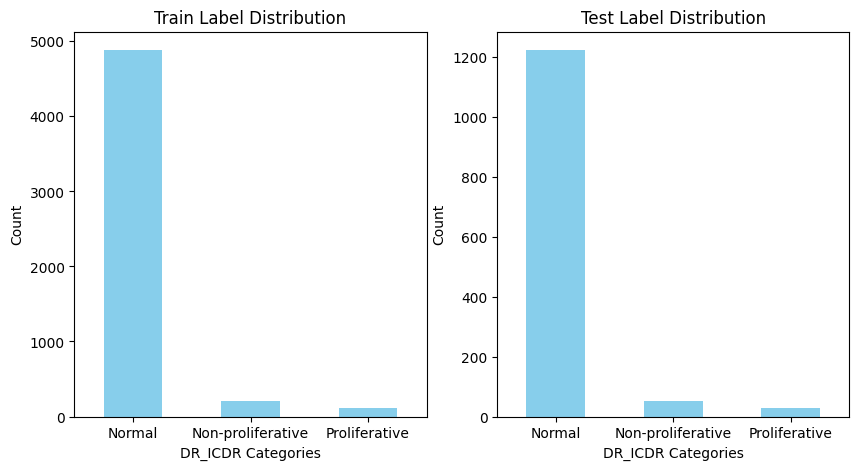

In [5]:
# Split dataset into train, test and validation:
#df_train, df_test = split_data(df, LABEL, TEST_SIZE, undersample=False)
print('Getting validation set...')
df_test, df_val = split_data(df_test, LABEL, 0.20)

### Dataloaders

In [6]:
# Train the one hot encoder on the train set and get the labels for the test and validation sets:
train_labels, mlb, train_columns = process_labels(df_train, col=LABEL)

In [7]:
# Define the target image shape
SHAPE = (224, 224)  # Adjust to your desired image size

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(SHAPE),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(50),  # Randomly rotate the image by up to 10 degrees
])

if NORM_MEAN is not None and NORM_STD is not None:
    train_transforms.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

test_transform = transforms.Compose([
    transforms.Resize(SHAPE),
    transforms.ToTensor(),
])

if NORM_MEAN is not None and NORM_STD is not None:
    test_transform.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))


In [8]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

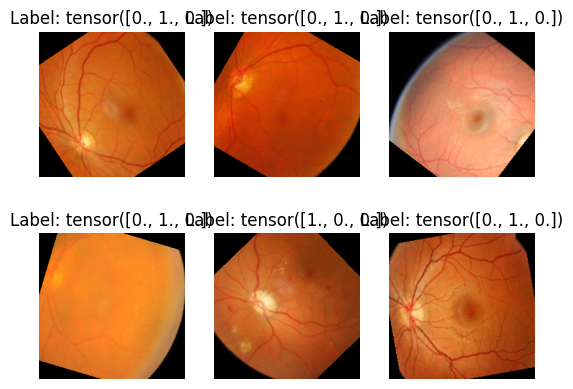

In [9]:
# Print 6 samples with their labels
# Iterate through the DataLoader and plot the images with labels
for batch in train_dataloader:
    images, labels = batch['image'], batch['labels']

    for i in range(len(images)):
        if i == 6:
            break
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].permute(1, 2, 0))  # Permute to (H, W, C) from (C, H, W)
        plt.title(f"Label: {labels[i]}")
        plt.axis('off')
    plt.show()
    break

### Model

In [10]:
# Create the model
backbone_model = FoundationalCVModel(backbone=BACKBONE, mode=MODE)
# Load backbone weights:
backbone_model.load_state_dict(torch.load('Models/checkpoint_convnextv2_base_byol_v2.pt'))
model = FoundationalCVModelWithClassifier(backbone_model, hidden=HIDDEN, num_classes=num_classes, mode=MODE, backbone_mode=backbone_mode)
model.to(device)

# Use DataParallel to parallelize the model across multiple GPUs
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, [0,1])

Using 2 GPUs!


### Training:

In [11]:
if LOSS == 'focal_loss':
    class_distribution = train_dataloader.dataset.labels.sum(axis=0)
    print(f'Class distribution: {class_distribution}')
    class_dis = np.array(class_distribution)
    class_weights =1-class_dis/np.sum(class_dis)
    weights = torch.tensor(class_weights).to(device)
    #criterion = FocalLoss()  # Focal Loss
    criterion = FocalLoss(gamma=2, alpha=weights)
else:
    # Assuming train_loader.dataset.labels is a one-hot representation
    class_indices = np.argmax(train_dataloader.dataset.labels, axis=1)

    # Compute class weights using class indices
    class_weights = compute_class_weight('balanced', classes=np.unique(class_indices), y=class_indices)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(device)
    #criterion = nn.BCEWithLogitsLoss() # Binary Cross-Entropy Loss

if OPTIMIZER == 'adam':
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
elif OPTIMIZER == 'adamw':
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
else:
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

In [12]:
model = train(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=num_epochs, save=True, device=device, backbone=f'convnextv2_binary_{LABEL}_byol')

100%|██████████| 82/82 [00:23<00:00,  3.47it/s]


Epoch 1, Train Loss: 1.0274659628750848, Val Loss: 0.942223396788283, F1 Score: 0.30772512464223795


100%|██████████| 82/82 [00:24<00:00,  3.40it/s]


Epoch 2, Train Loss: 0.9441589644209283, Val Loss: 0.8373000629064513, F1 Score: 0.5245210341251614


100%|██████████| 82/82 [00:24<00:00,  3.39it/s]


Epoch 3, Train Loss: 0.8639841217486585, Val Loss: 0.7972978504329193, F1 Score: 0.5234019909938105


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 4, Train Loss: 0.8113435031937771, Val Loss: 0.7583940147263247, F1 Score: 0.5182984644044596


100%|██████████| 82/82 [00:24<00:00,  3.39it/s]


Epoch 5, Train Loss: 0.7612397710319425, Val Loss: 0.8203520206053082, F1 Score: 0.6443410712703508


100%|██████████| 82/82 [00:23<00:00,  3.45it/s]


Epoch 6, Train Loss: 0.7342632213088333, Val Loss: 0.7534825985388058, F1 Score: 0.5917148882053856


100%|██████████| 82/82 [00:24<00:00,  3.42it/s]


Epoch 7, Train Loss: 0.6980535679176205, Val Loss: 0.564789206153009, F1 Score: 0.6956077720943451


100%|██████████| 82/82 [00:23<00:00,  3.52it/s]


Epoch 8, Train Loss: 0.6640294344698796, Val Loss: 0.6284544638744215, F1 Score: 0.6807458044778835


100%|██████████| 82/82 [00:23<00:00,  3.47it/s]


Epoch 9, Train Loss: 0.6422546253707565, Val Loss: 0.7929856904396196, F1 Score: 0.5578339634856145


100%|██████████| 82/82 [00:23<00:00,  3.45it/s]


Epoch 10, Train Loss: 0.6408459939795439, Val Loss: 0.5998469213160073, F1 Score: 0.7104275469573397


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 11, Train Loss: 0.5920459220888185, Val Loss: 0.5853762273199674, F1 Score: 0.671682450576923


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 12, Train Loss: 0.5868946473373742, Val Loss: 0.5717198253586525, F1 Score: 0.7019940297532271


100%|██████████| 82/82 [00:23<00:00,  3.42it/s]


Epoch 13, Train Loss: 0.5709009999989486, Val Loss: 0.5450092961148518, F1 Score: 0.6417137178986968


100%|██████████| 82/82 [00:23<00:00,  3.44it/s]


Epoch 14, Train Loss: 0.5494466130545393, Val Loss: 0.4924237670876631, F1 Score: 0.7014884147509249


100%|██████████| 82/82 [00:23<00:00,  3.43it/s]


Epoch 15, Train Loss: 0.4683905047288195, Val Loss: 0.48434923053151224, F1 Score: 0.7514948750304398


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 16, Train Loss: 0.4697325713932514, Val Loss: 0.4898203850337645, F1 Score: 0.7783642328311283


100%|██████████| 82/82 [00:24<00:00,  3.37it/s]


Epoch 17, Train Loss: 0.41669150167068497, Val Loss: 0.4462113205070903, F1 Score: 0.7778854375645698


100%|██████████| 82/82 [00:24<00:00,  3.41it/s]


Epoch 18, Train Loss: 0.43794078738963016, Val Loss: 0.4316342174098259, F1 Score: 0.772249166193021


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 19, Train Loss: 0.3783133895915063, Val Loss: 0.4526601850804759, F1 Score: 0.7882748226233899


100%|██████████| 82/82 [00:23<00:00,  3.50it/s]


Epoch 20, Train Loss: 0.4362481201098102, Val Loss: 0.5641020023059554, F1 Score: 0.7897967851445383


100%|██████████| 82/82 [00:24<00:00,  3.41it/s]


Epoch 21, Train Loss: 0.40297494743202555, Val Loss: 0.5603820153671067, F1 Score: 0.7539519903808993


100%|██████████| 82/82 [00:23<00:00,  3.46it/s]


Epoch 22, Train Loss: 0.34399049530630227, Val Loss: 0.5048224899645258, F1 Score: 0.7565386269243244


100%|██████████| 82/82 [00:23<00:00,  3.45it/s]


Epoch 23, Train Loss: 0.3188148178007515, Val Loss: 0.6347477729091557, F1 Score: 0.7790948111963202


100%|██████████| 82/82 [00:24<00:00,  3.41it/s]


Epoch 24, Train Loss: 0.31172414289207245, Val Loss: 0.6934346380847983, F1 Score: 0.8019279251277802


100%|██████████| 82/82 [00:23<00:00,  3.49it/s]


Epoch 25, Train Loss: 0.29398291656655856, Val Loss: 0.43540487579274467, F1 Score: 0.7737953834817072


100%|██████████| 82/82 [00:23<00:00,  3.42it/s]


Epoch 26, Train Loss: 0.2978960722074157, Val Loss: 0.9144674472329093, F1 Score: 0.7988369793667068


100%|██████████| 82/82 [00:23<00:00,  3.45it/s]


Epoch 27, Train Loss: 0.2611291086576024, Val Loss: 0.6915653330932666, F1 Score: 0.8567923278455076


100%|██████████| 82/82 [00:23<00:00,  3.44it/s]


Epoch 28, Train Loss: 0.2541968879915896, Val Loss: 0.5178376395346188, F1 Score: 0.6909452656598433


100%|██████████| 82/82 [00:23<00:00,  3.43it/s]


Epoch 29, Train Loss: 0.25294134627844467, Val Loss: 0.6122310628387623, F1 Score: 0.8275000088781876


100%|██████████| 82/82 [00:23<00:00,  3.47it/s]


Epoch 30, Train Loss: 0.21504352192287562, Val Loss: 0.7011173887223732, F1 Score: 0.8429916972914114


100%|██████████| 82/82 [00:23<00:00,  3.48it/s]


Epoch 31, Train Loss: 0.19682576184420555, Val Loss: 0.47031885206063345, F1 Score: 0.7398313554470981


100%|██████████| 82/82 [00:23<00:00,  3.44it/s]


Epoch 32, Train Loss: 0.2024803218462306, Val Loss: 0.5581506940240903, F1 Score: 0.7877828239623444


100%|██████████| 82/82 [00:23<00:00,  3.47it/s]


Epoch 33, Train Loss: 0.2388953409249299, Val Loss: 0.7215431723289374, F1 Score: 0.7783410098566984


100%|██████████| 82/82 [00:24<00:00,  3.41it/s]


Epoch 34, Train Loss: 0.24598872551969328, Val Loss: 1.5438366924616984, F1 Score: 0.8192276624322884
Early stopping triggered.


### Test

100%|██████████| 326/326 [01:28<00:00,  3.66it/s]


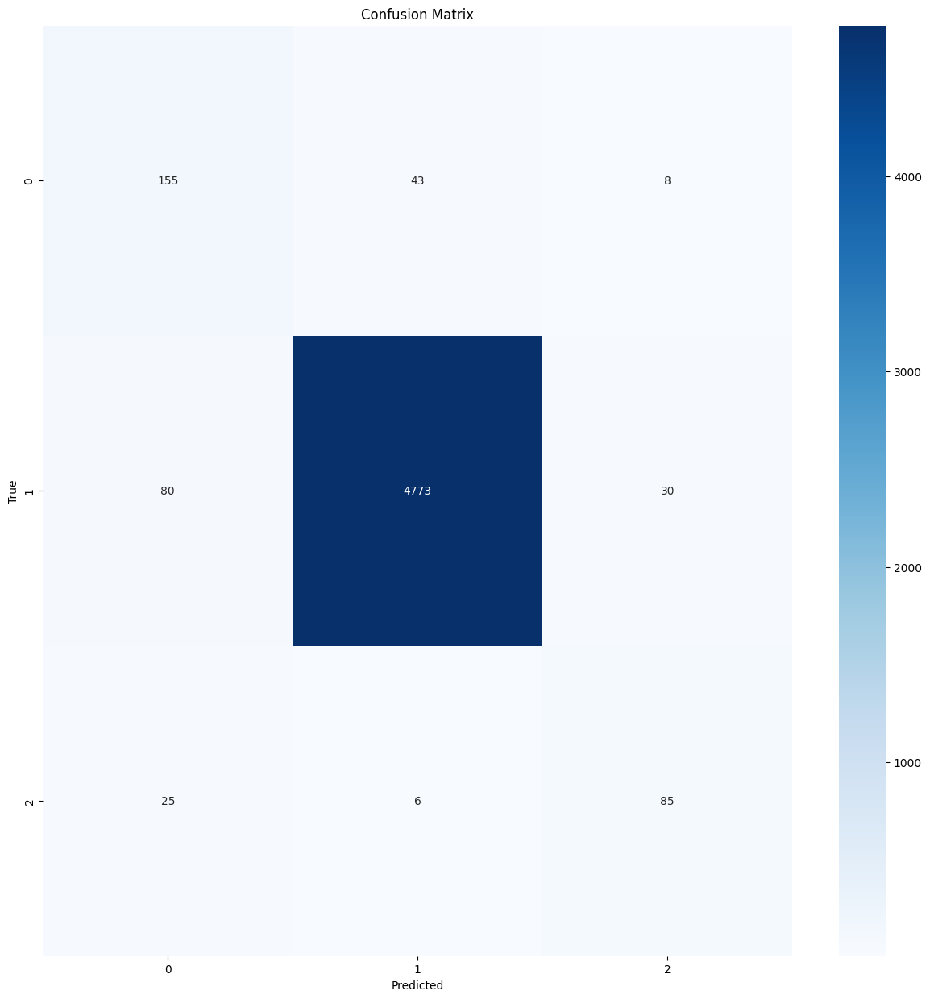

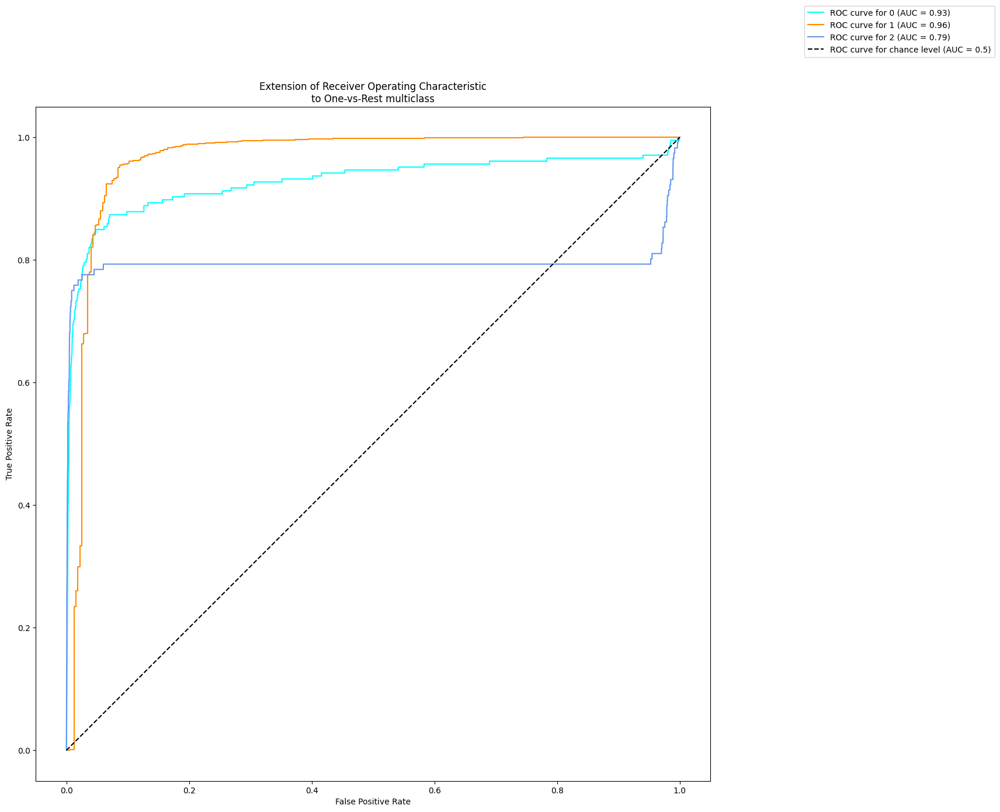

              precision    recall  f1-score   support

           0       0.60      0.75      0.67       206
           1       0.99      0.98      0.98      4883
           2       0.69      0.73      0.71       116

    accuracy                           0.96      5205
   macro avg       0.76      0.82      0.79      5205
weighted avg       0.97      0.96      0.96      5205

##################################################  Saliency Maps  ##################################################

Class 0:


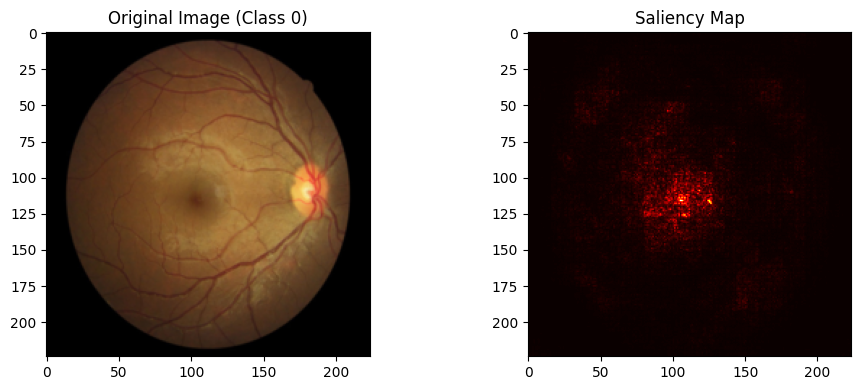

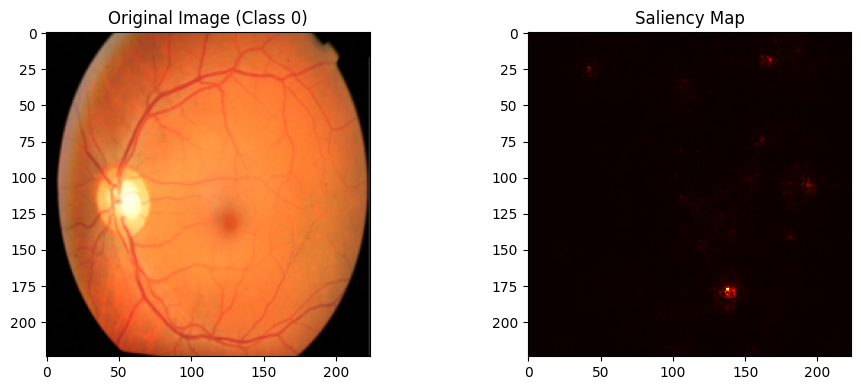

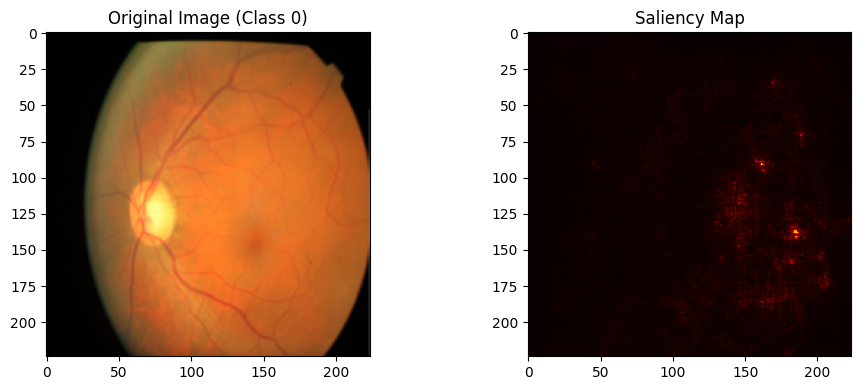

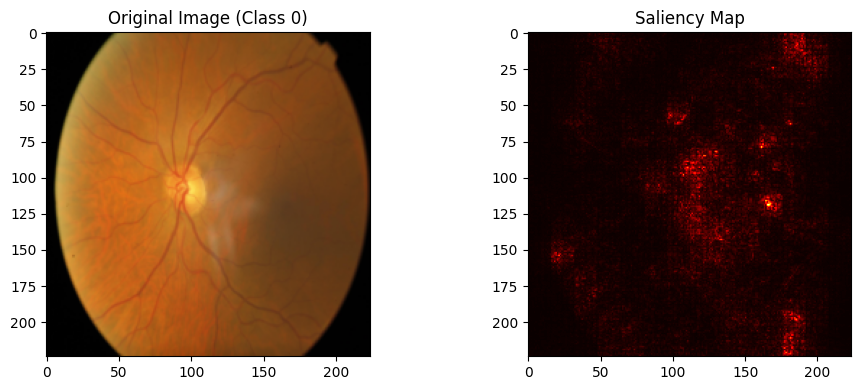

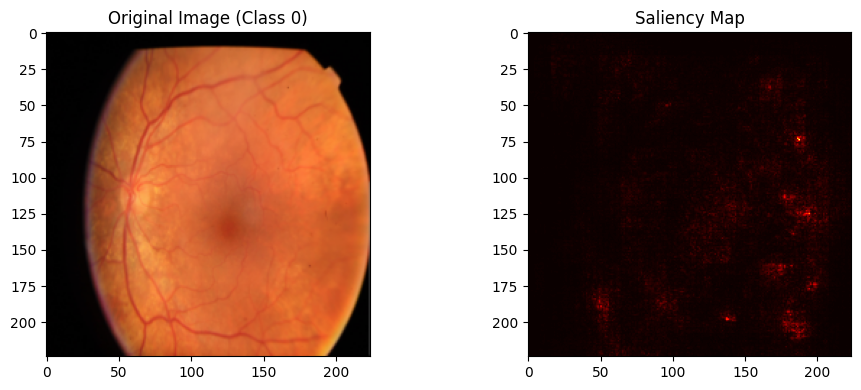

Class 1:


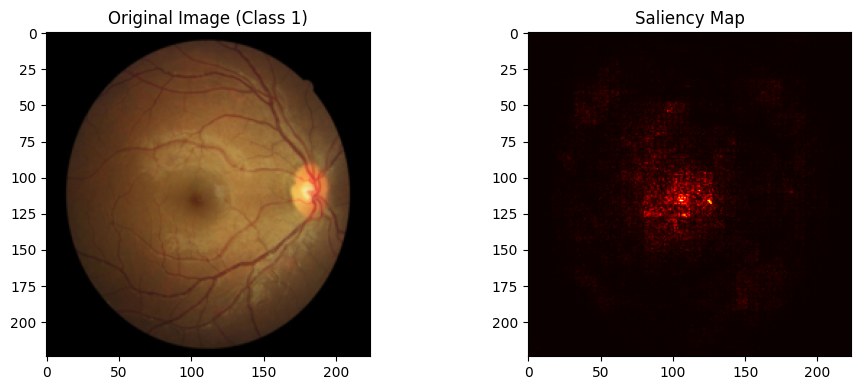

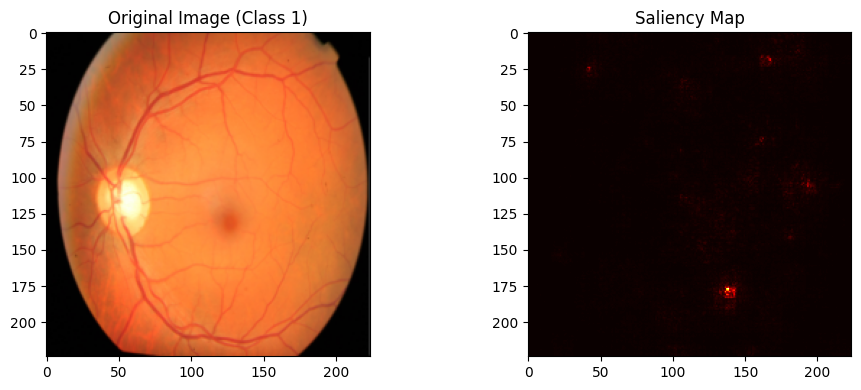

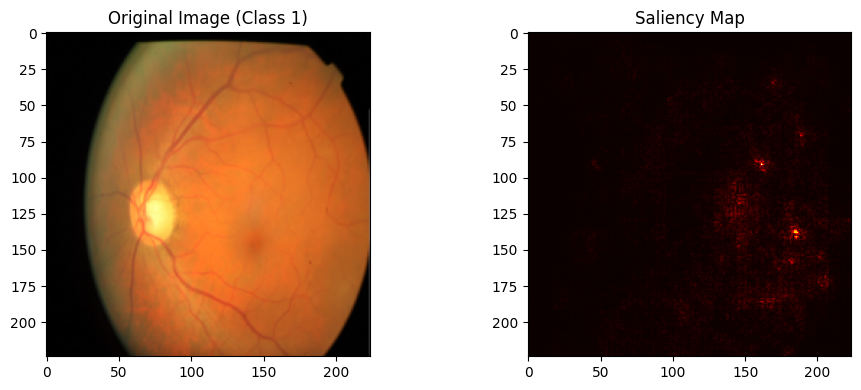

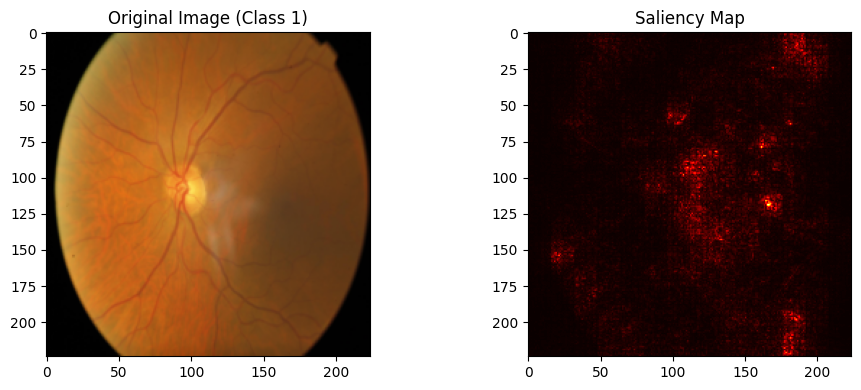

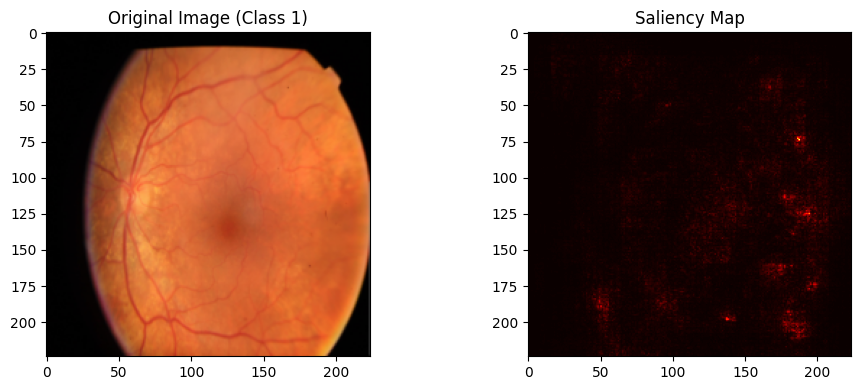

Class 2:


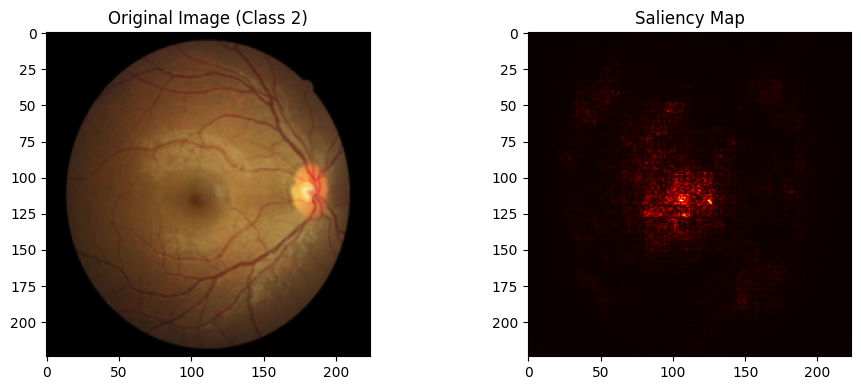

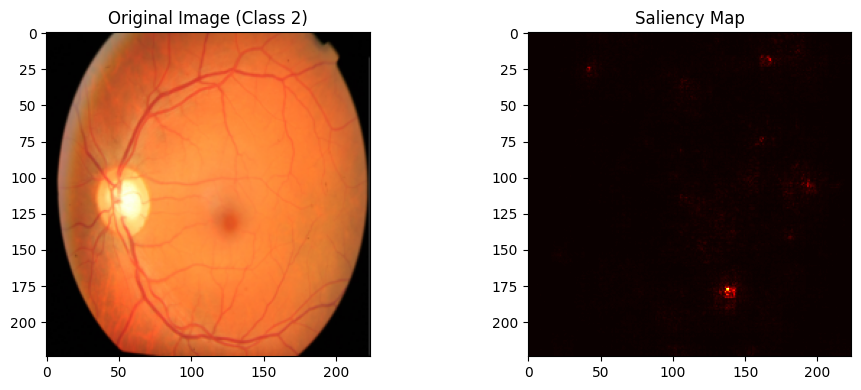

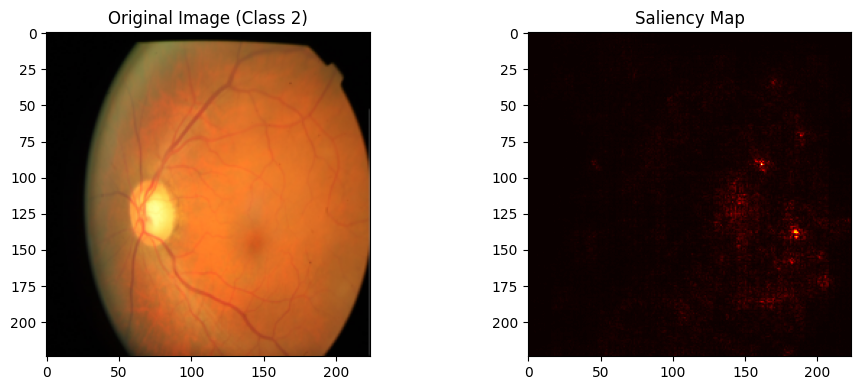

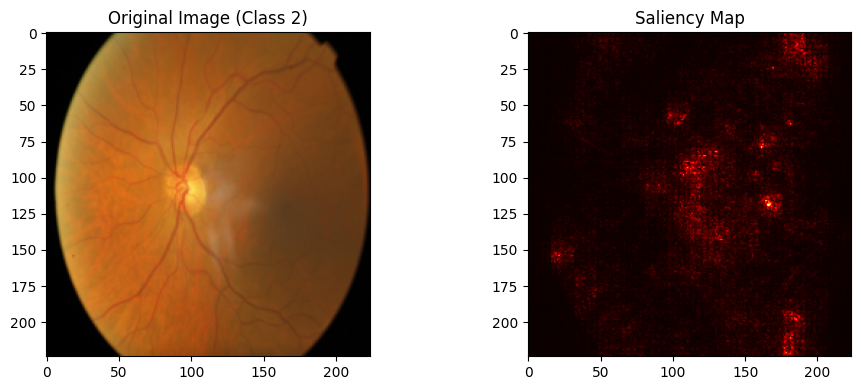

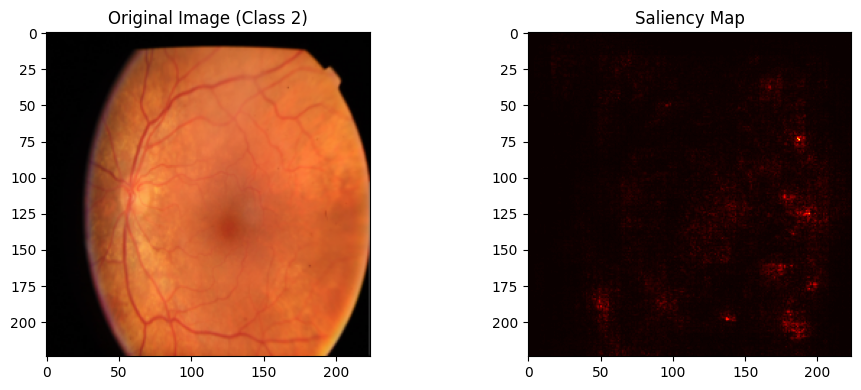

In [13]:
test(model, test_dataloader, saliency=True, device=device)

### Image quality assessment

In [14]:
# Good quality images
adequate_df = df_test[df_test['quality'] == 'Adequate']

# Bad quality images
inadequate_df = df_test[df_test['quality'] == 'Inadequate']

adequate_dataset = BRSETDataset(
    adequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

inadequate_dataset = BRSETDataset(
    inadequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

adequate_dataloader = DataLoader(adequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
inadequate_dataloader = DataLoader(inadequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

#### Adequate image quality

100%|██████████| 287/287 [01:19<00:00,  3.63it/s]


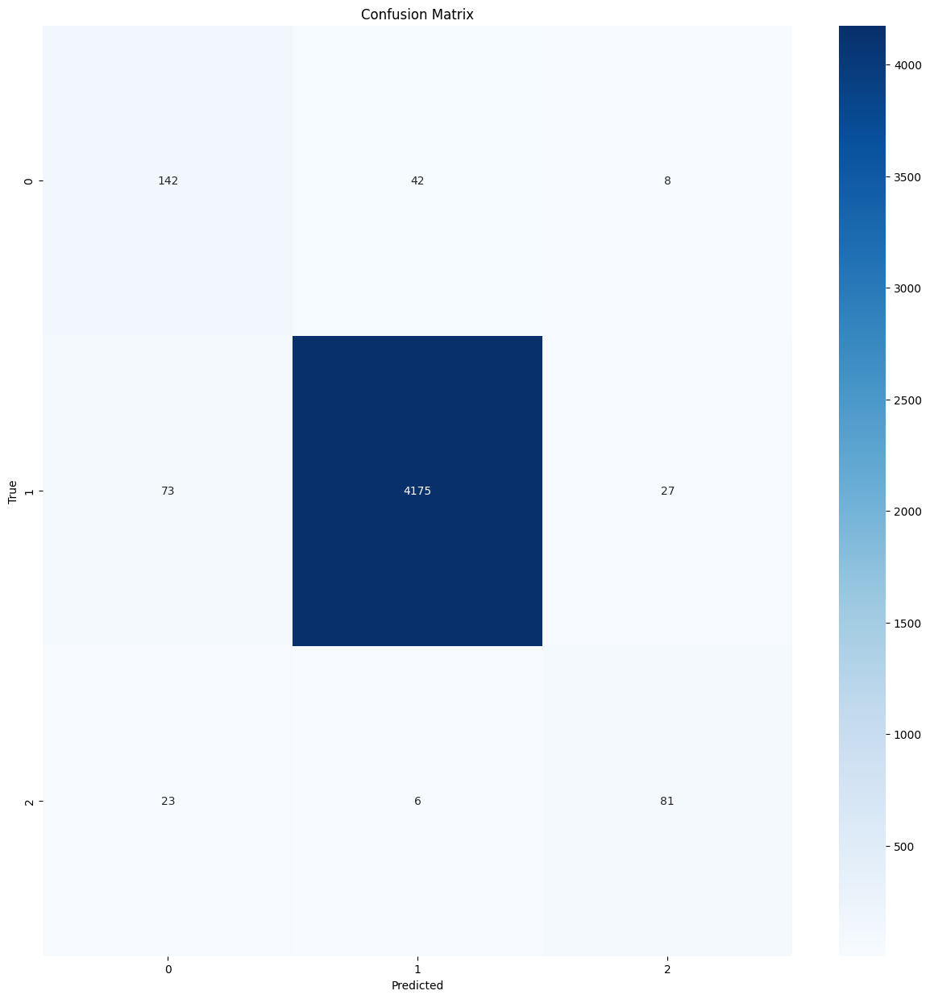

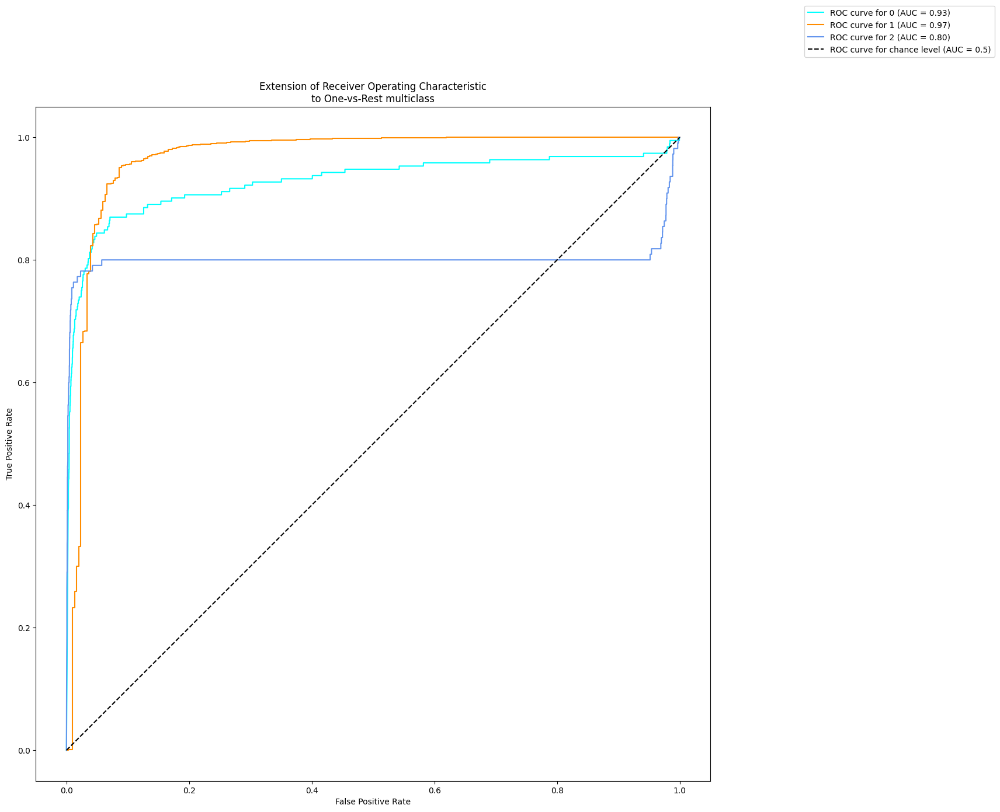

              precision    recall  f1-score   support

           0       0.60      0.74      0.66       192
           1       0.99      0.98      0.98      4275
           2       0.70      0.74      0.72       110

    accuracy                           0.96      4577
   macro avg       0.76      0.82      0.79      4577
weighted avg       0.97      0.96      0.96      4577

##################################################  Saliency Maps  ##################################################

Class 0:


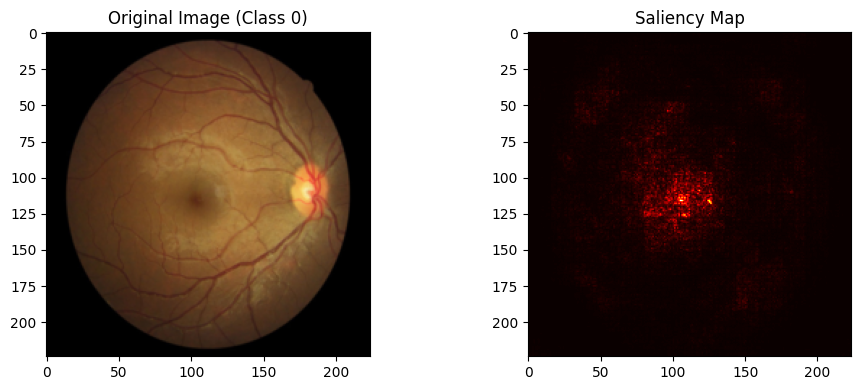

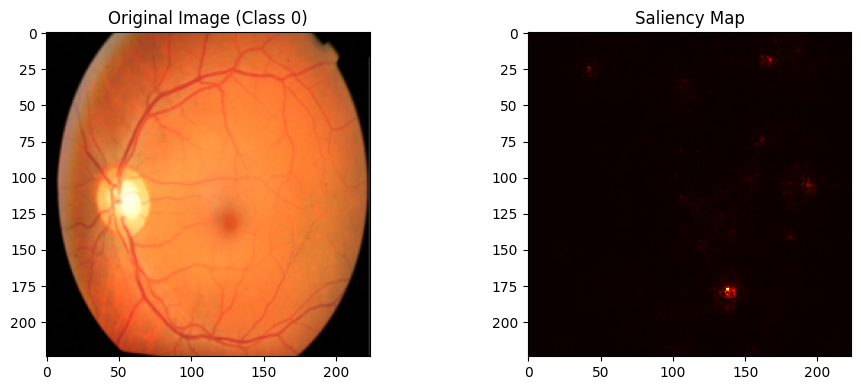

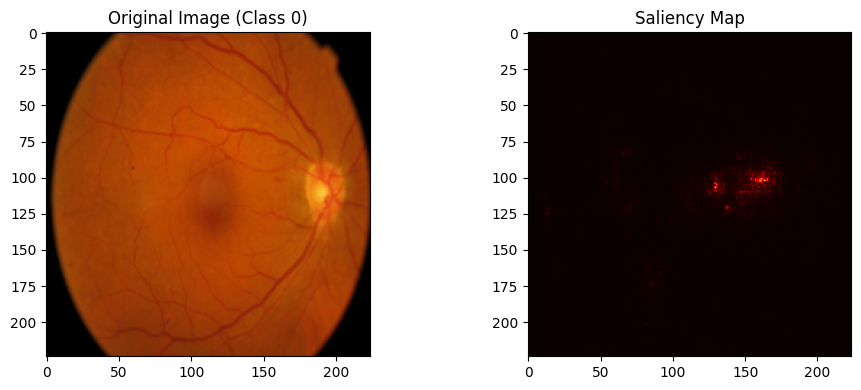

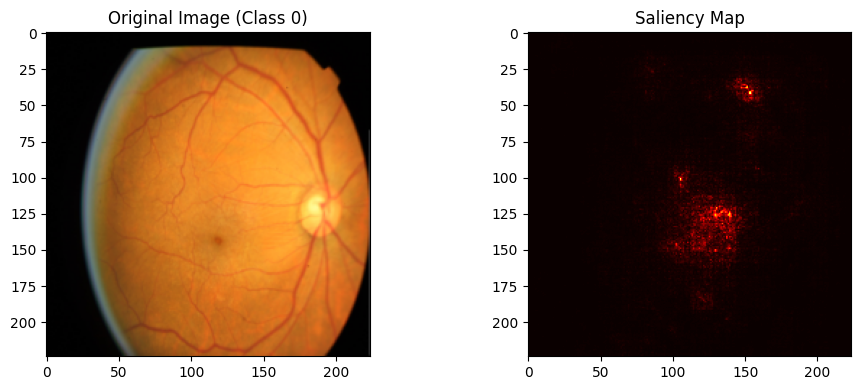

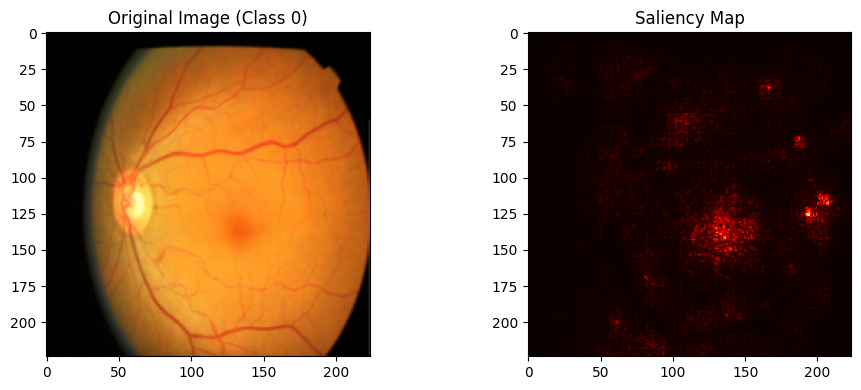

Class 1:


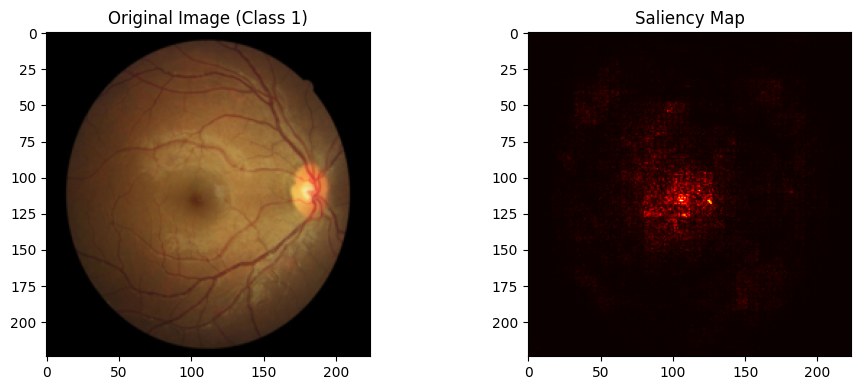

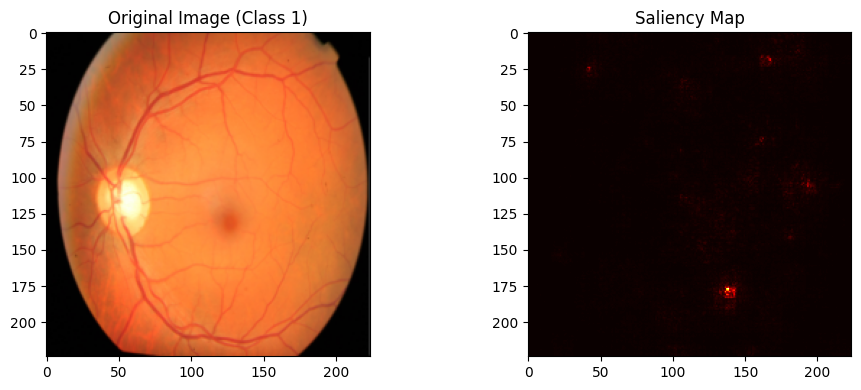

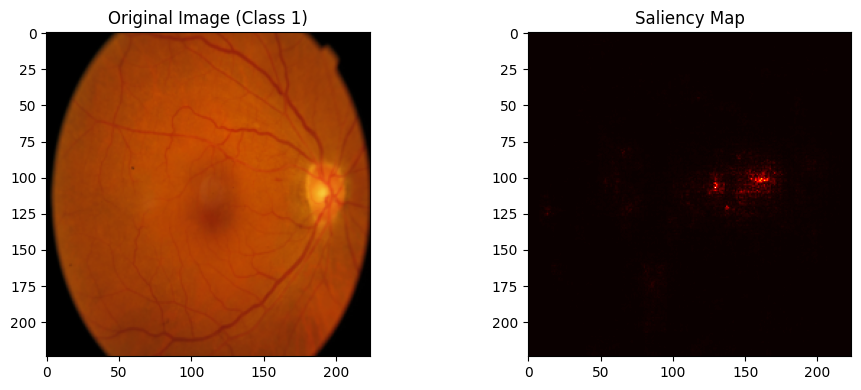

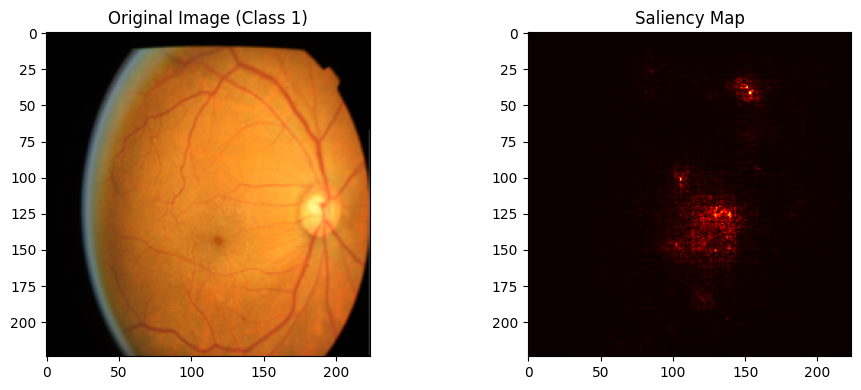

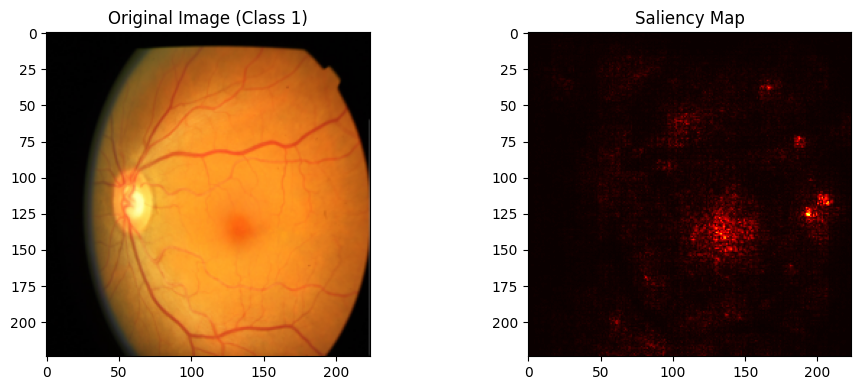

Class 2:


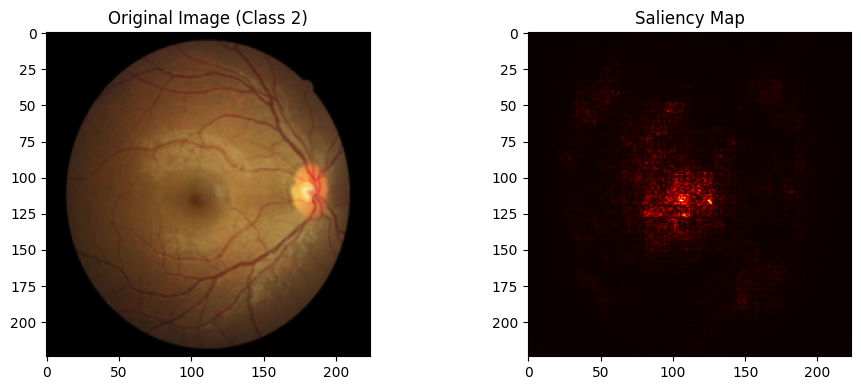

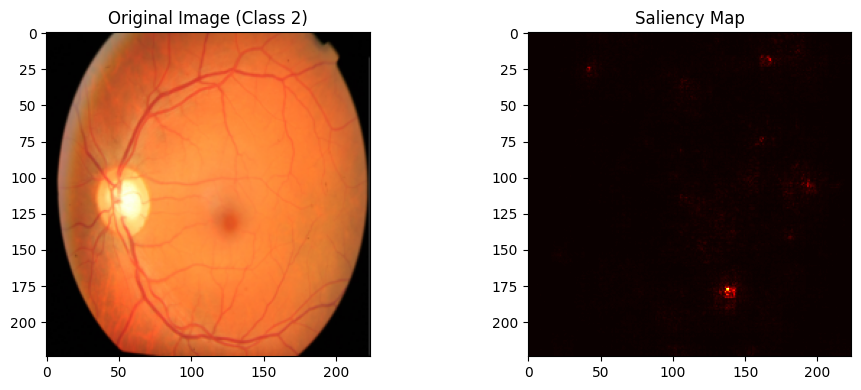

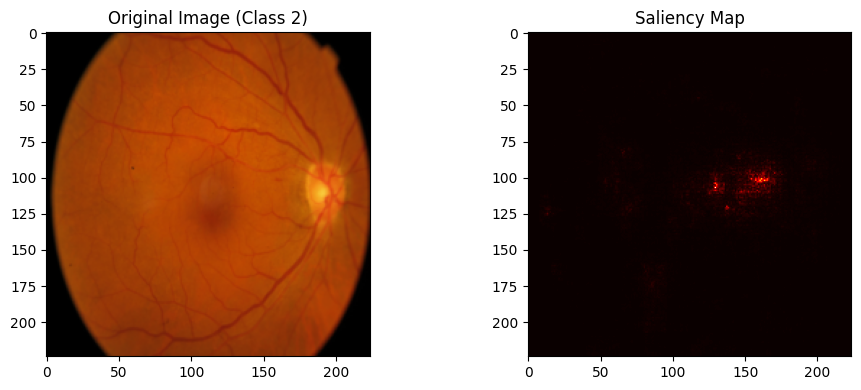

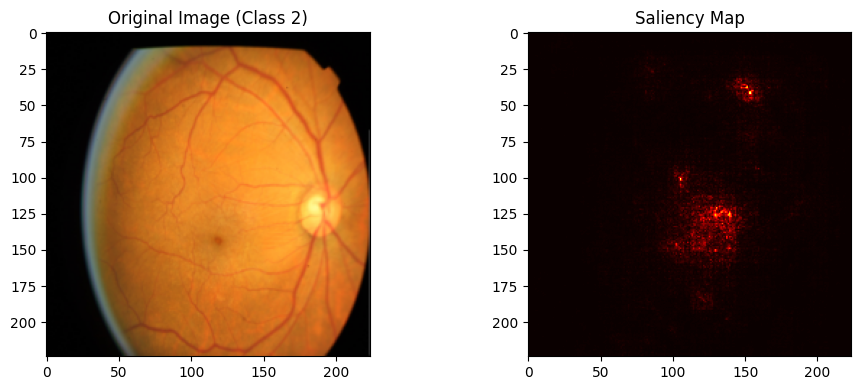

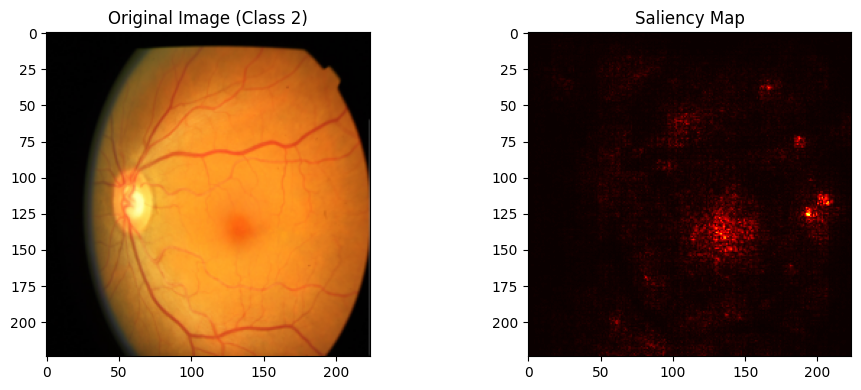

In [15]:
test(model, adequate_dataloader, saliency=True, device=device, save=True)

#### Inadequate image quality

100%|██████████| 40/40 [00:12<00:00,  3.28it/s]


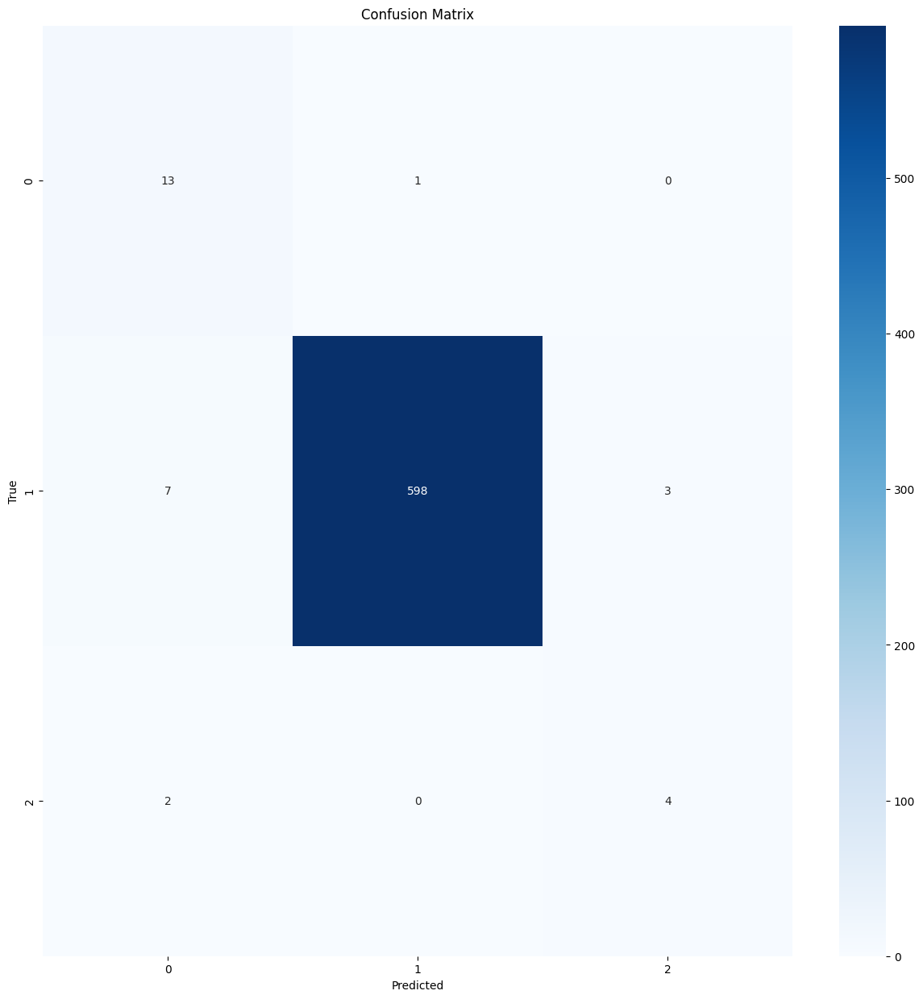

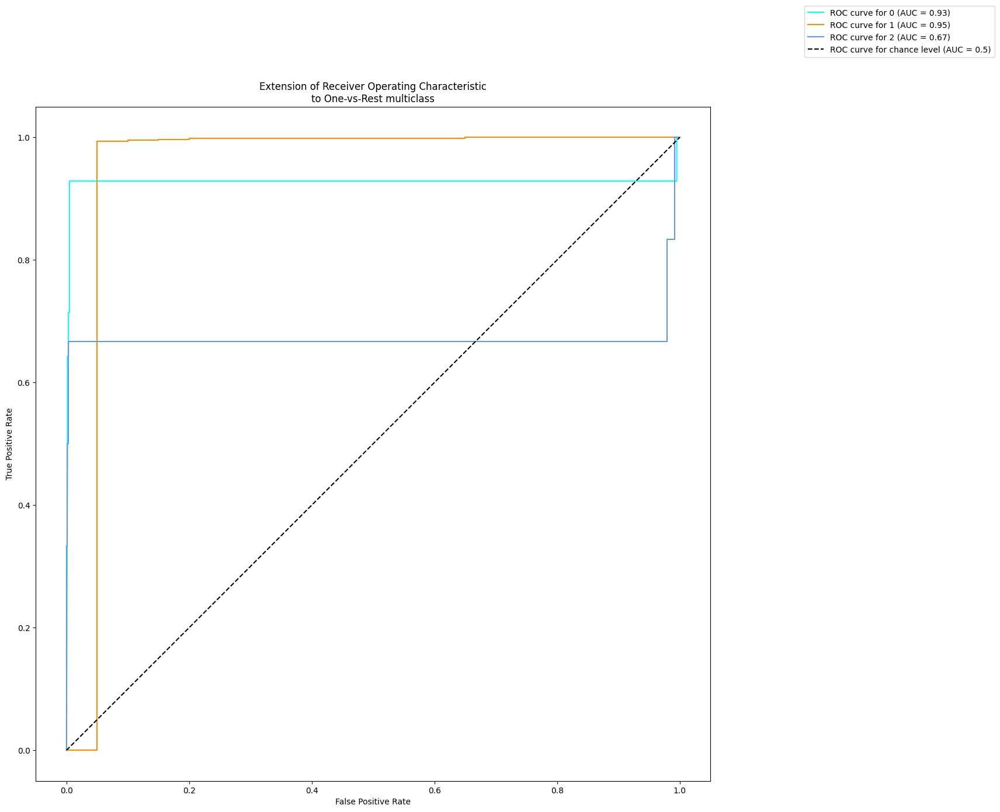

              precision    recall  f1-score   support

           0       0.59      0.93      0.72        14
           1       1.00      0.98      0.99       608
           2       0.57      0.67      0.62         6

    accuracy                           0.98       628
   macro avg       0.72      0.86      0.78       628
weighted avg       0.99      0.98      0.98       628

##################################################  Saliency Maps  ##################################################

Class 0:


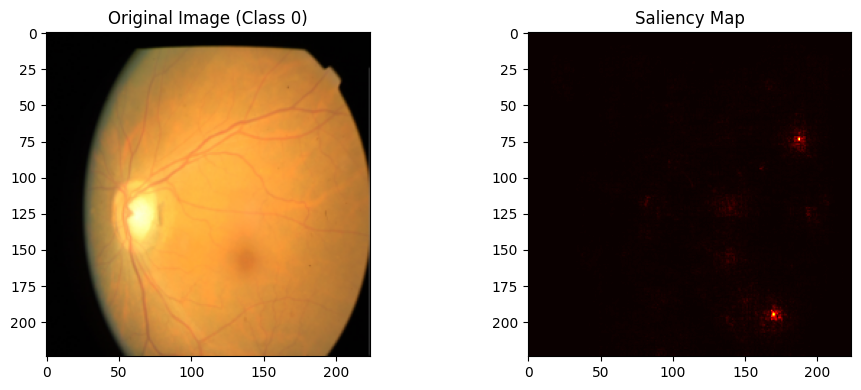

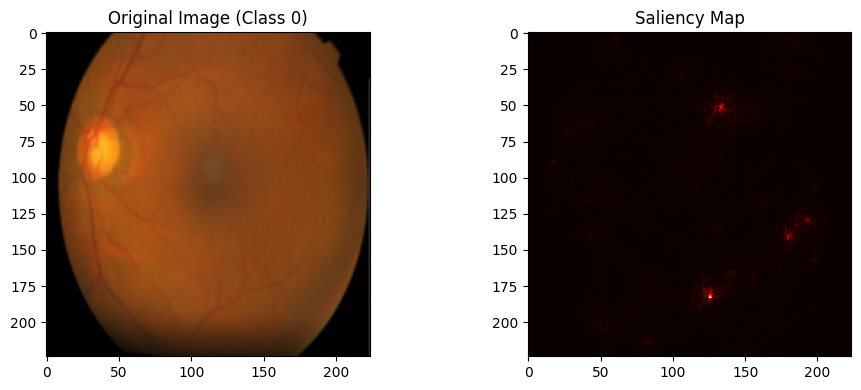

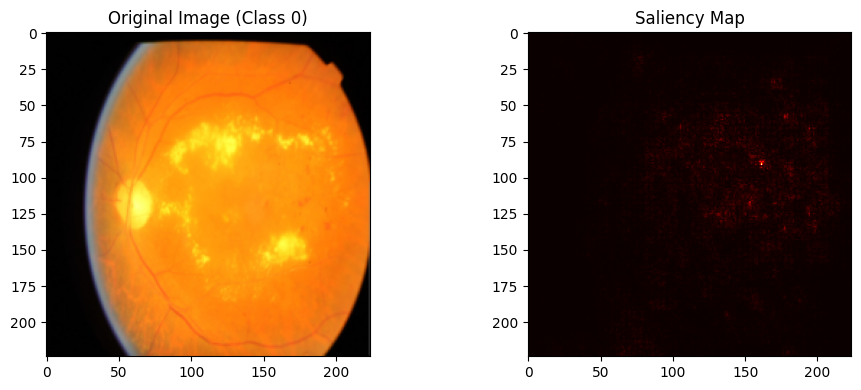

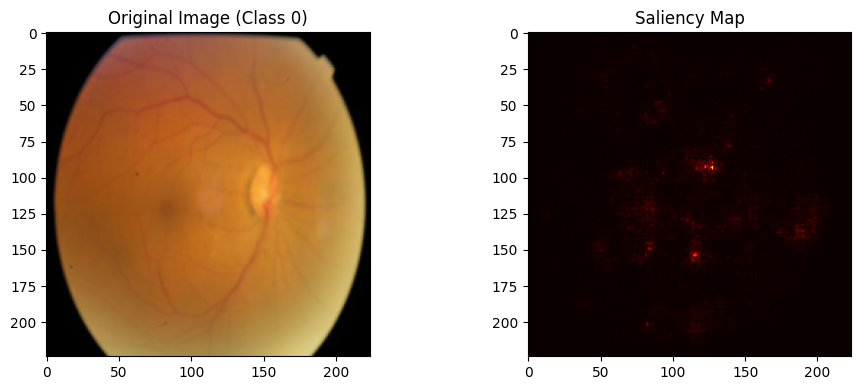

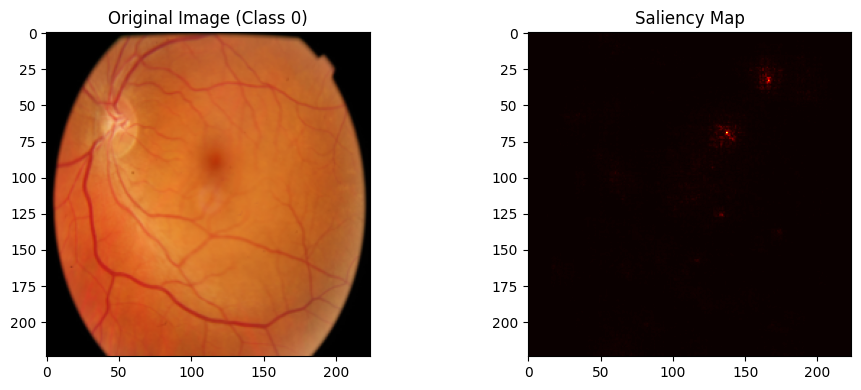

Class 1:


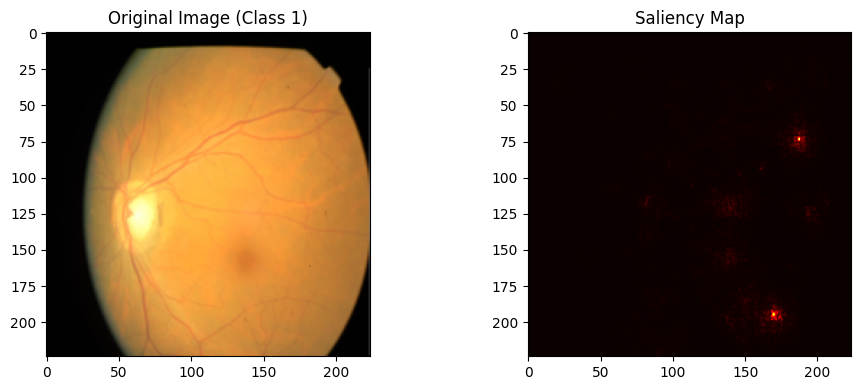

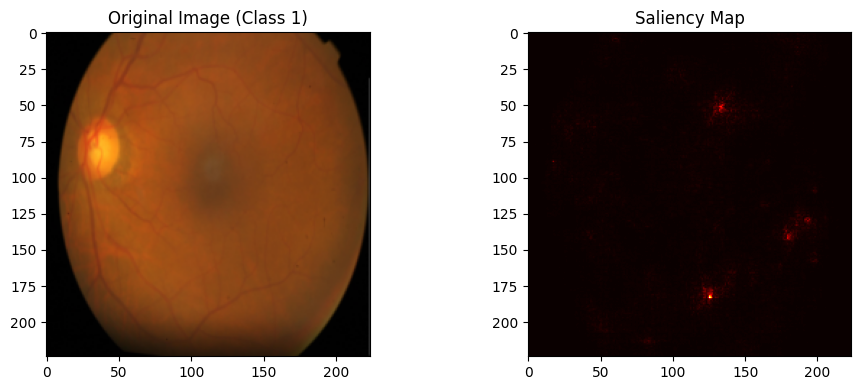

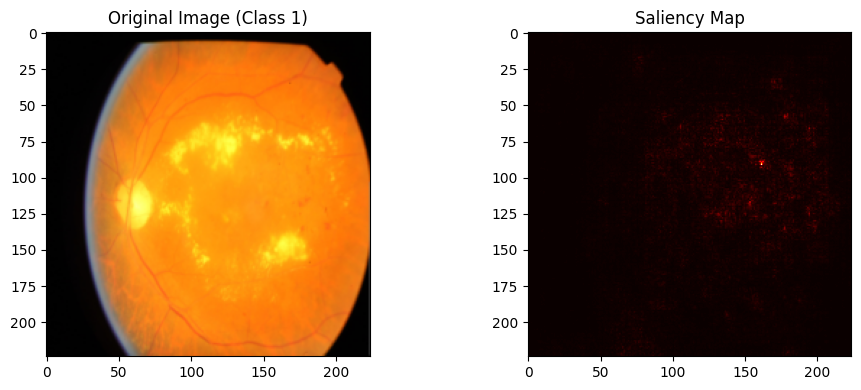

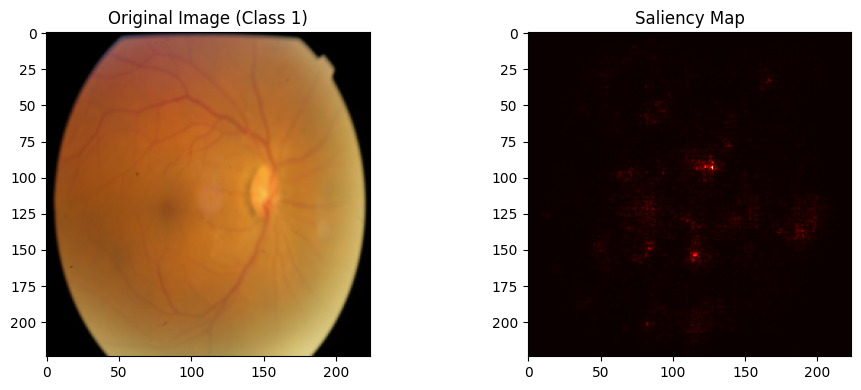

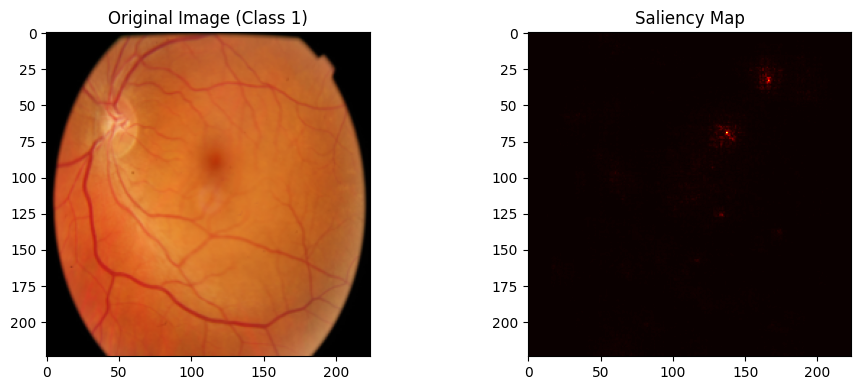

Class 2:


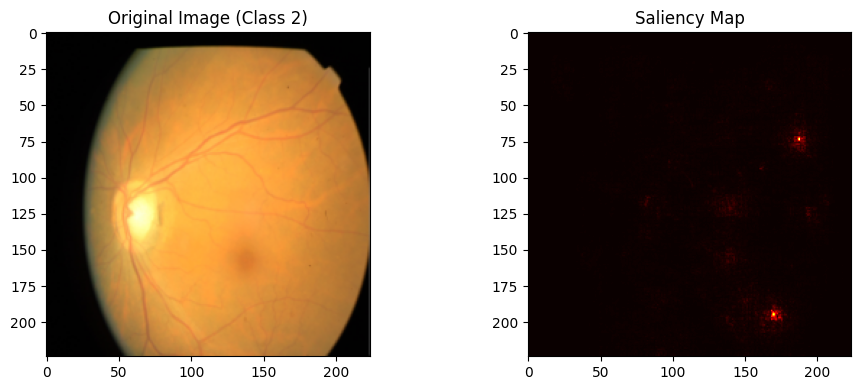

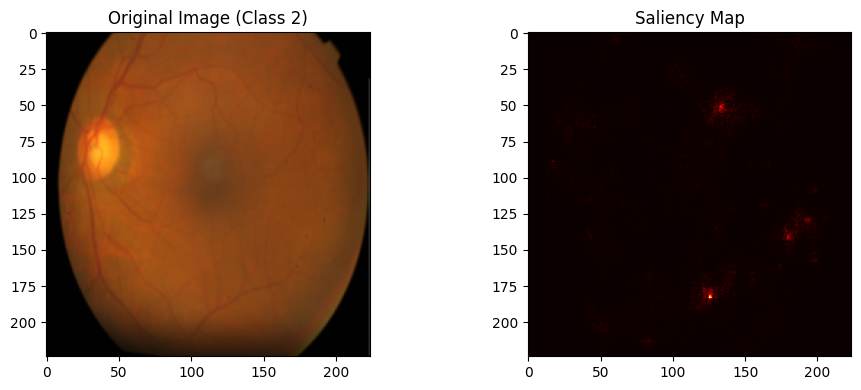

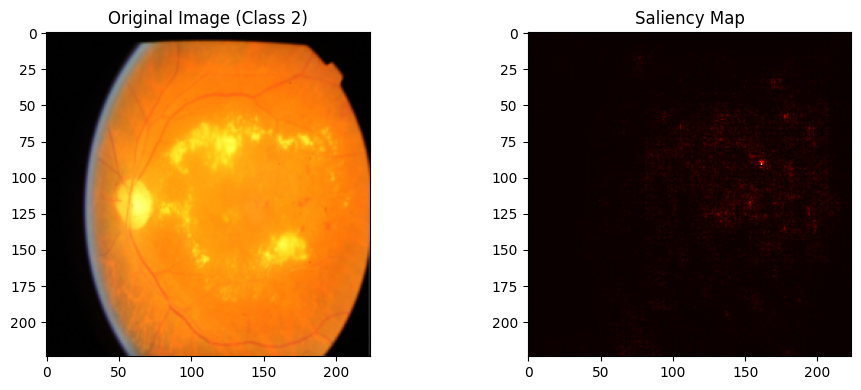

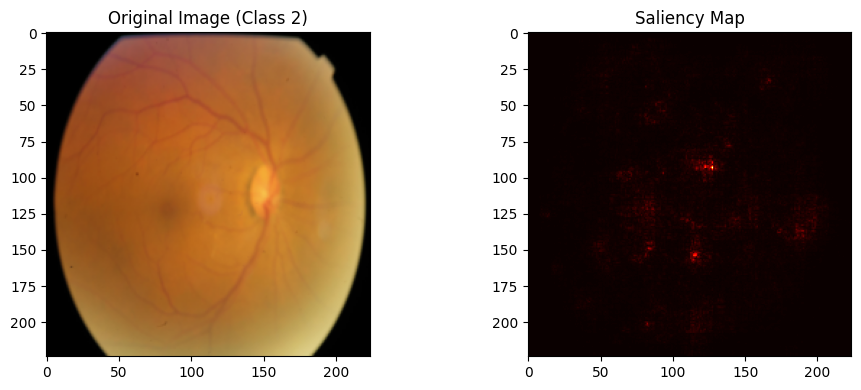

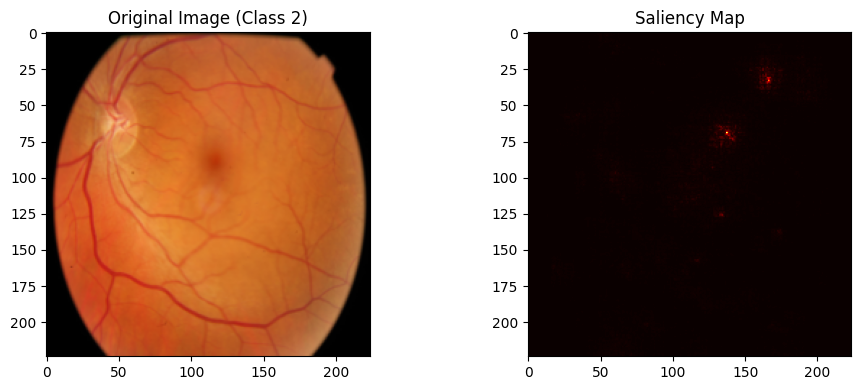

In [16]:
test(model, inadequate_dataloader, saliency=True, device=device)